# Proyek Klasifikasi Gambar: [Animals-10]
- **Nama:** Meysi Supmawati
- **Email:** meysi.supmawati25@gmail.com
- **ID Dicoding:** meysi supmawati

## Import Library

In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from sklearn.model_selection import train_test_split
import random
import cv2
from tensorflow.keras.regularizers import l2
from IPython.display import display, FileLink
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow_hub as hub
from tensorflow import keras

2025-04-22 10:02:18.129152: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745316138.151308     297 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745316138.158073     297 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Data Preparation

In [2]:
data_dir = '/kaggle/input/animals10/raw-img'
if not os.path.exists(data_dir):
    raise FileNotFoundError(f"Dataset tidak ditemukan di {data_dir}")

translate = {
    "cane": "Anjing",
    "gatto": "Kucing",
    "cavallo": "Kuda",
    "ragno": "Laba-laba",
    "farfalla": "Kupu-kupu",
    "gallina": "Ayam",
    "mucca": "Sapi",
    "elefante": "Gajah",
    "pecora": "Domba",
    "scoiattolo": "Tupai"
}

data = []
for class_name in os.listdir(data_dir):
    class_dir = os.path.join(data_dir, class_name)
    if os.path.isdir(class_dir):
        translated_class = translate.get(class_name.lower(), class_name)
        
        for img_name in os.listdir(class_dir):
            data.append([os.path.join(class_dir, img_name), translated_class])

df = pd.DataFrame(data, columns=['path', 'class'])

df_balanced = (
    df.groupby('class', group_keys=False, sort=False)
      .apply(lambda x: x.sample(min(len(x), 1400)))
      .reset_index(drop=True)
)

print(df_balanced['class'].value_counts())

class
Kuda         1400
Domba        1400
Gajah        1400
Kucing       1400
Tupai        1400
Ayam         1400
Laba-laba    1400
Sapi         1400
Anjing       1400
Kupu-kupu    1400
Name: count, dtype: int64


/tmp/ipykernel_297/2369965280.py:31: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min(len(x), 1400)))


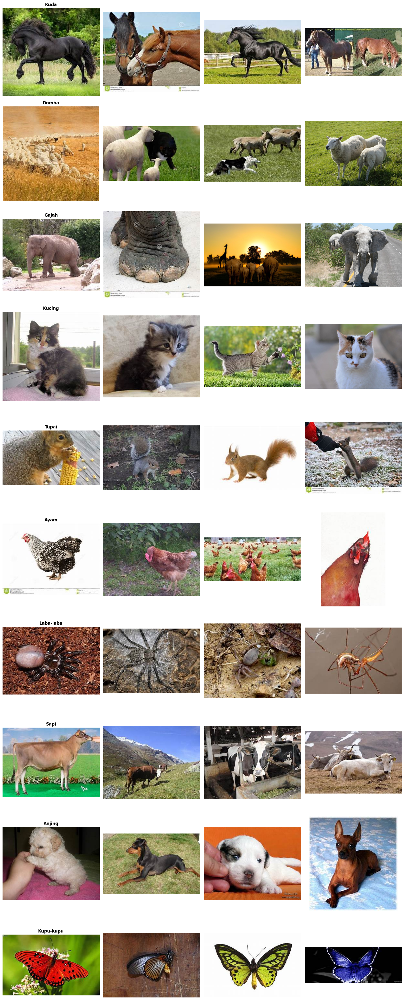

In [3]:
def plot_sample_images(df_balanced, num_images=4):
    unique_classes = df_balanced['class'].unique()
    fig, axes = plt.subplots(len(unique_classes), num_images, figsize=(num_images * 4, len(unique_classes) * 4))

    for i, class_name in enumerate(unique_classes):
        sample_images = df_balanced[df_balanced['class'] == class_name].sample(n=min(num_images, len(df_balanced[df_balanced['class'] == class_name])))

        for j, (_, row) in enumerate(sample_images.iterrows()):
            img = cv2.imread(row['path'])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[i, j].imshow(img)
            axes[i, j].axis("off")

            if j == 0:
                axes[i, j].set_title(class_name, fontsize=12, fontweight="bold")

    plt.tight_layout()
    plt.show()

plot_sample_images(df_balanced)

## Data Preprocessing

#### Data Splitting & Image Data Generator

In [4]:
TRAIN_DF, TEST_DF = train_test_split(df_balanced, test_size=0.2, stratify=df_balanced['class'], random_state=42)

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    validation_split=0.2, # 20% dari training set dipakai untuk validation
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

train_generator = train_datagen.flow_from_dataframe(
    TRAIN_DF,
    x_col='path',
    y_col='class',
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=16,
    shuffle=True,
    subset='training'
)

val_generator = train_datagen.flow_from_dataframe(
    TRAIN_DF,
    x_col='path',
    y_col='class',
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=32,
    shuffle=False,
    subset='validation'
)

test_datagen = ImageDataGenerator(rescale=1.0 / 255)
test_generator = test_datagen.flow_from_dataframe(
    TEST_DF,
    x_col='path',
    y_col='class',
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 8960 validated image filenames belonging to 10 classes.
Found 2240 validated image filenames belonging to 10 classes.
Found 2800 validated image filenames belonging to 10 classes.


In [5]:
print(f"Total data setelah balancing: {len(df_balanced)}")
print(f"Total training data: {len(TRAIN_DF)}")  
print(f"Total testing data: {len(TEST_DF)}")

Total data setelah balancing: 14000
Total training data: 11200
Total testing data: 2800


## Modelling

#### Transfer Learning EfficientNetV2S

In [6]:
!pip install tensorflow-hub

In [7]:
from tensorflow.keras.applications import EfficientNetV2S

base_model = EfficientNetV2S(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
base_model.trainable = True

from tensorflow.keras import layers, models

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.5),
    layers.Dense(10, activation="softmax")
])

model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
model.summary()

I0000 00:00:1745316317.186963     297 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1745316317.187590     297 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


82420632/82420632 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetv2-s (Functional)        │ (None, 7, 7, 1280)          │      20,331,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         327,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           2,570 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,661,866 (78.82 MB)

 Trainable params: 20,507,994 (78.23 MB)

 Non-trainable params: 153,872 (601.06 KB)

In [8]:
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss=keras.losses.CategoricalCrossentropy(),
    metrics=[
        keras.metrics.CategoricalAccuracy(),
        keras.metrics.F1Score(average="macro")
    ]
)

stop_callback = keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=1e-3,
    patience=3,
    restore_best_weights=True
)

epochs = 15

history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=epochs,
    callbacks=[stop_callback]
)

Epoch 1/15


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1745316445.499481     360 service.cc:148] XLA service 0x7dc28c005b80 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745316445.506719     360 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1745316445.506748     360 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1745316456.541655     360 cuda_dnn.cc:529] Loaded cuDNN version 90300
E0000 00:00:1745316473.303875     360 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing war

560/560 ━━━━━━━━━━━━━━━━━━━━ 404s 393ms/step - categorical_accuracy: 0.1738 - f1_score: 0.1650 - loss: 2.2468 - val_categorical_accuracy: 0.6558 - val_f1_score: 0.6490 - val_loss: 1.6246
Epoch 2/15
560/560 ━━━━━━━━━━━━━━━━━━━━ 142s 252ms/step - categorical_accuracy: 0.6346 - f1_score: 0.6277 - loss: 1.3924 - val_categorical_accuracy: 0.8674 - val_f1_score: 0.8681 - val_loss: 0.7392
Epoch 3/15
560/560 ━━━━━━━━━━━━━━━━━━━━ 142s 251ms/step - categorical_accuracy: 0.8200 - f1_score: 0.8175 - loss: 0.6967 - val_categorical_accuracy: 0.9192 - val_f1_score: 0.9200 - val_loss: 0.4070
Epoch 4/15
560/560 ━━━━━━━━━━━━━━━━━━━━ 141s 249ms/step - categorical_accuracy: 0.8649 - f1_score: 0.8639 - loss: 0.4788 - val_categorical_accuracy: 0.9312 - val_f1_score: 0.9318 - val_loss: 0.3028
Epoch 5/15
560/560 ━━━━━━━━━━━━━━━━━━━━ 142s 252ms/step - categorical_accuracy: 0.8924 - f1_score: 0.8913 - loss: 0.3803 - val_categorical_accuracy: 0.9379 - val_f1_score: 0.9384 - val_loss: 0.2513
Epoch 6/15
560/560 ━━

## Evaluasi dan Visualisasi

#### Plot Akurasi, Plot Loss dan F1 Score

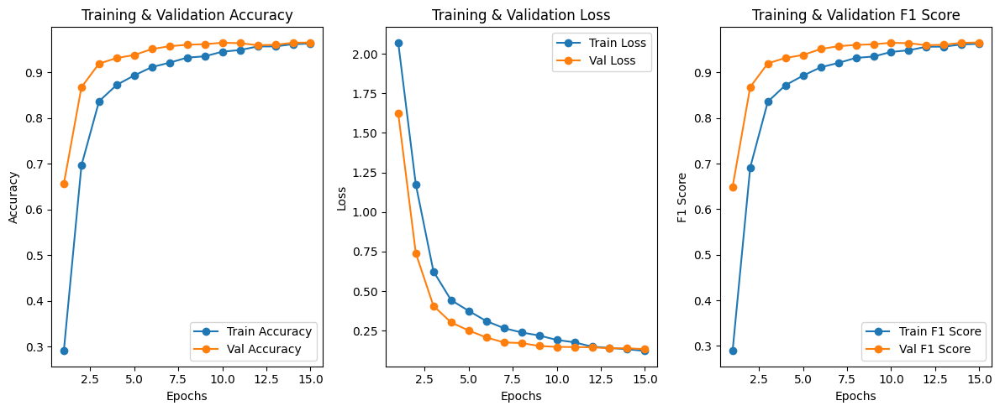

In [9]:
train_acc = history.history["categorical_accuracy"]
val_acc = history.history["val_categorical_accuracy"]
train_loss = history.history["loss"]
val_loss = history.history["val_loss"]
train_f1 = history.history["f1_score"]
val_f1 = history.history["val_f1_score"]

epochs_range = range(1, len(train_acc) + 1)

plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.plot(epochs_range, train_acc, label="Train Accuracy", marker="o")
plt.plot(epochs_range, val_acc, label="Val Accuracy", marker="o")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Training & Validation Accuracy")

plt.subplot(1, 3, 2)
plt.plot(epochs_range, train_loss, label="Train Loss", marker="o")
plt.plot(epochs_range, val_loss, label="Val Loss", marker="o")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Training & Validation Loss")

plt.subplot(1, 3, 3)
plt.plot(epochs_range, train_f1, label="Train F1 Score", marker="o")
plt.plot(epochs_range, val_f1, label="Val F1 Score", marker="o")
plt.xlabel("Epochs")
plt.ylabel("F1 Score")
plt.legend()
plt.title("Training & Validation F1 Score")

plt.tight_layout()
plt.show()


#### Evaluasi Perfoma Model

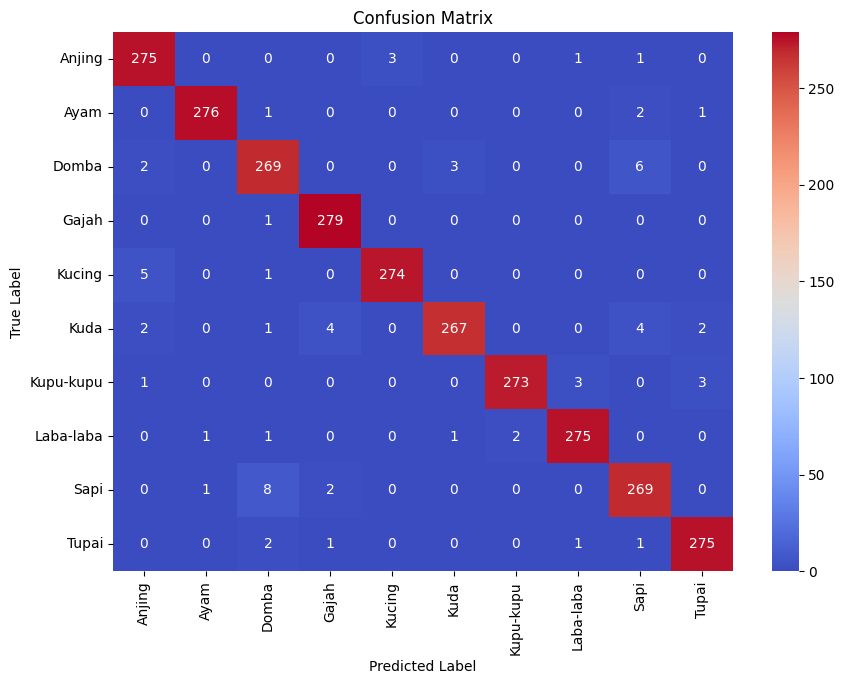


Classification Report:

              precision    recall  f1-score   support

      Anjing     0.9649    0.9821    0.9735       280
        Ayam     0.9928    0.9857    0.9892       280
       Domba     0.9472    0.9607    0.9539       280
       Gajah     0.9755    0.9964    0.9859       280
      Kucing     0.9892    0.9786    0.9838       280
        Kuda     0.9852    0.9536    0.9691       280
   Kupu-kupu     0.9927    0.9750    0.9838       280
   Laba-laba     0.9821    0.9821    0.9821       280
        Sapi     0.9505    0.9607    0.9556       280
       Tupai     0.9786    0.9821    0.9804       280

    accuracy                         0.9757      2800
   macro avg     0.9759    0.9757    0.9757      2800
weighted avg     0.9759    0.9757    0.9757      2800



In [10]:
test_generator.reset()

preds = model.predict(test_generator, verbose=0)
pred_labels = np.argmax(preds, axis=1)

true_labels = test_generator.classes
class_names = list(test_generator.class_indices.keys())

cm = confusion_matrix(true_labels, pred_labels)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=class_names, yticklabels=class_names, cmap="coolwarm")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

print("\nClassification Report:\n")
print(classification_report(y_true=true_labels, y_pred=pred_labels, target_names=class_names, digits=4))

## Konversi Model

In [11]:
model.save('model.keras')
model.save('model.h5')

converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

with open("model.tflite", "wb") as f:
    f.write(tflite_model)

!pip install tensorflowjs
import tensorflowjs as tfjs

tfjs.converters.save_keras_model(model, "model_tfjs")

model.export('saved_model')

Saved artifact at '/tmp/tmpf3x7u94a'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_513')
Output Type:
  TensorSpec(shape=(None, 10), dtype=tf.float32, name=None)
Captures:
  138278478650768: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478651728: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478652304: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478652880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478653264: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478651920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478653072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478652496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478653648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478651344: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478

W0000 00:00:1745319221.966011     297 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1745319221.966054     297 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
I0000 00:00:1745319222.339490     297 mlir_graph_optimization_pass.cc:401] MLIR V1 optimization pass is not enabled


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 2.4 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datasets 3.5.0 requires fsspec[http]<=2024.12.0,>=2023.1.0, but you have fsspec 2025.3.2 which is incompatible.
nilearn 0.11.1 requires scikit-learn>=1.4.0, but you have scikit-learn 1.2.2 which is incompatible.
pandas-gbq 0.26.1 requires google-api-core<3.0.0dev,>=2.10.2, but you have google-api-core 1.34.1 which is incompatible.
bigframes 1.36.0 requires rich<14,>=12.4.4, but you have rich 14.0.0 which is incompatible.
plotnine 0.14.5 requires matplotlib>=3.8.0, but you have matplotlib 3.7.5 which is 

failed to lookup keras version from the file,
    this is likely a weight only file
Saved artifact at 'saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_513')
Output Type:
  TensorSpec(shape=(None, 10), dtype=tf.float32, name=None)
Captures:
  138278478650768: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478651728: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478652304: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478652880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478653264: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478651920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478653072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478652496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138278478653648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  

In [12]:
!zip model_keras.zip model.keras  # Untuk format .keras
!zip model_h5.zip model.h5        # Untuk format .h5
!zip -r model_saved.zip saved_model/  # Untuk TensorFlow SavedModel
!zip -r model_tflite.zip model.tflite  # Untuk format TFLite
!zip -r model_tfjs.zip model_tfjs/     # Untuk TensorFlow.js

  adding: model.keras (deflated 8%)
  adding: model.h5 (deflated 8%)
  adding: saved_model/ (stored 0%)
  adding: saved_model/fingerprint.pb (stored 0%)
  adding: saved_model/saved_model.pb (deflated 92%)
  adding: saved_model/assets/ (stored 0%)
  adding: saved_model/variables/ (stored 0%)
  adding: saved_model/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: saved_model/variables/variables.index (deflated 77%)
  adding: model.tflite (deflated 7%)
  adding: model_tfjs/ (stored 0%)
  adding: model_tfjs/group1-shard18of20.bin (deflated 7%)
  adding: model_tfjs/group1-shard16of20.bin (deflated 7%)
  adding: model_tfjs/group1-shard9of20.bin (deflated 7%)
  adding: model_tfjs/group1-shard5of20.bin (deflated 7%)
  adding: model_tfjs/group1-shard15of20.bin (deflated 7%)
  adding: model_tfjs/group1-shard11of20.bin (deflated 7%)
  adding: model_tfjs/model.json (deflated 97%)
  adding: model_tfjs/group1-shard4of20.bin (deflated 7%)
  adding: model_tfjs/group1-shard10of20.bin (def

In [13]:
display(FileLink('model_h5.zip'))
display(FileLink('model_keras.zip'))
display(FileLink('model_saved.zip'))
display(FileLink('model_tflite.zip'))
display(FileLink('model_tfjs.zip'))

/kaggle/working/model_h5.zip

/kaggle/working/model_keras.zip

/kaggle/working/model_saved.zip

/kaggle/working/model_tflite.zip

/kaggle/working/model_tfjs.zip

In [14]:
!pip freeze > requirements.txt
from IPython.display import FileLink

FileLink("requirements.txt")

/kaggle/working/requirements.txt

## Inference (TF-Lite)

In [15]:
import zipfile

with zipfile.ZipFile("model_tflite.zip", "r") as zip_ref:
    zip_ref.extractall("model_tflite")

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


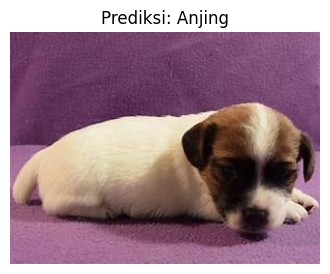

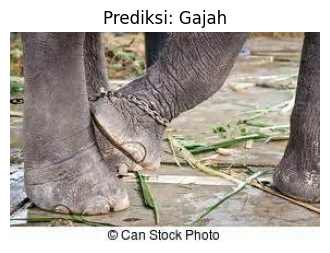

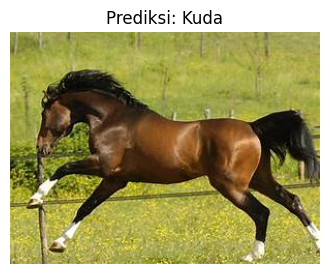

In [16]:
interpreter = tf.lite.Interpreter(model_path="model_tflite/model.tflite")
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
input_shape = input_details[0]['shape']  # (1, 224, 224, 3) biasanya

img_paths = [
    "/kaggle/input/animals10/raw-img/cane/OIP---ZRsOF7zsMqhW30WeF8-AHaFj.jpeg",
    "/kaggle/input/animals10/raw-img/elefante/OIP---LeldVL441fx5S66TGgVQAAAA.jpeg",
    "/kaggle/input/animals10/raw-img/cavallo/OIP---MGqQIhmz3OEPYP-46_xwHaFj.jpeg"
]

idx_to_class_indo = {
    0: "Anjing", 1: "Ayam", 2: "Domba", 3: "Gajah", 4: "Kucing",
    5: "Kuda", 6: "Kupu-kupu", 7: "Laba-laba", 8: "Sapi", 9: "Tupai"
}

batch_imgs = []
for img_path in img_paths:
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img) / 255.0
    batch_imgs.append(img_array)

batch_imgs = np.array(batch_imgs, dtype=np.float32)

if len(input_shape) == 4 and input_shape[0] == 1:
    for i in range(len(batch_imgs)):
        img_array = np.expand_dims(batch_imgs[i], axis=0)
        
        interpreter.set_tensor(input_details[0]['index'], img_array)
        interpreter.invoke()
        output_data = interpreter.get_tensor(output_details[0]['index'])
        
        predicted_idx = np.argmax(output_data)
        predicted_class = idx_to_class_indo[predicted_idx]
        
        # Tampilkan gambar & prediksi
        plt.figure(figsize=(4, 4))
        plt.imshow(image.load_img(img_paths[i]))
        plt.axis("off")
        plt.title(f"Prediksi: {predicted_class}")
        plt.show()

else:
    interpreter.set_tensor(input_details[0]['index'], batch_imgs)
    interpreter.invoke()
    output_data = interpreter.get_tensor(output_details[0]['index'])

    predicted_idxs = np.argmax(output_data, axis=1)

    plt.figure(figsize=(12, 4))
    for i in range(len(img_paths)):
        plt.subplot(1, 3, i+1)
        plt.imshow(image.load_img(img_paths[i]))
        plt.axis("off")
        plt.title(f"Prediksi: {idx_to_class_indo[predicted_idxs[i]]}")
    plt.show()